In [1]:
using Plots
using DifferentialEquations
using JuliaMBD
using JuliaMBD.Diagram
using LookupTable

In [3]:
include("ReMETI_Vertical_Vibration.jl")

┌ Warning: The port Dict{Any, Any}("label" => "", "name" => "F_TR_R2RD_N", "id" => "3UYtC_OvFeZKXhPd5Z_a-79", "parent" => "3UYtC_OvFeZKXhPd5Z_a-75", "type" => "outport") has not been used.
└ @ JuliaMBD.Diagram /root/.julia/packages/JuliaMBD/ZFbOr/src/diagrams/_xml2model.jl:76
┌ Warning: The port Dict{Any, Any}("label" => "", "name" => "F_TR_F2RD_N", "id" => "3UYtC_OvFeZKXhPd5Z_a-84", "parent" => "3UYtC_OvFeZKXhPd5Z_a-80", "type" => "outport") has not been used.
└ @ JuliaMBD.Diagram /root/.julia/packages/JuliaMBD/ZFbOr/src/diagrams/_xml2model.jl:76


LoadError: LoadError: UndefVarError: `end_of_road_surface` not defined
in expression starting at /workspaces/JuliaMBD-sample/JuliaMBD-sample-okamura2/ReMETI_Vertical_Vibration.jl:297

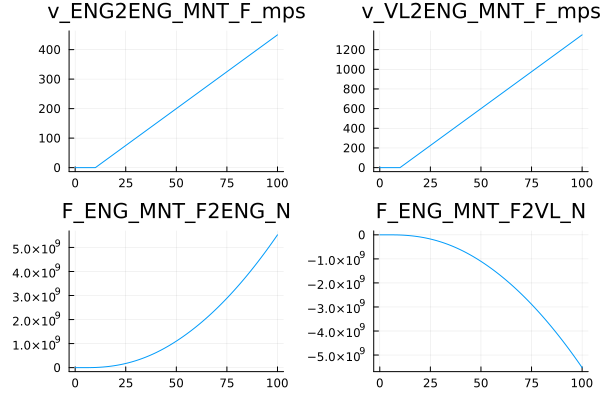

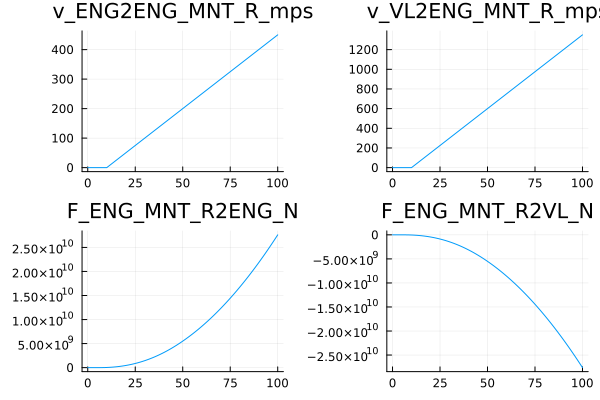

Test Summary: |Time
ENG_MNT_F_PNT | None  0.5s


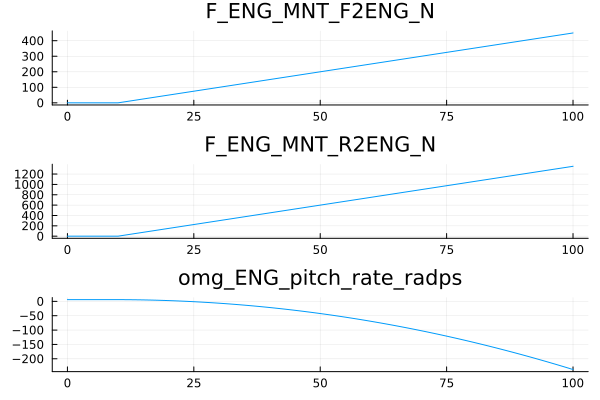

Test Summary: |Time
ENG_MNT_R_PNT | None  0.6s


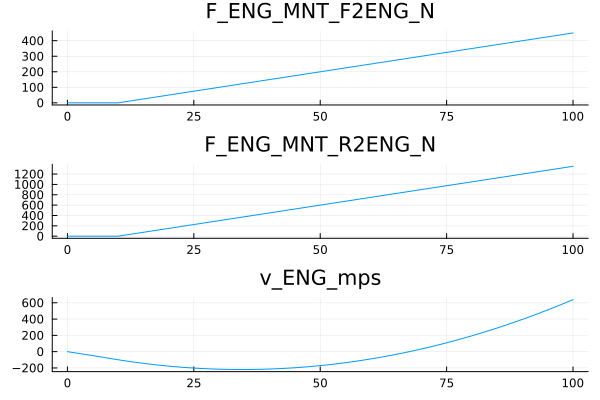

Test Summary: |Time
pitch_rate    | None  0.4s


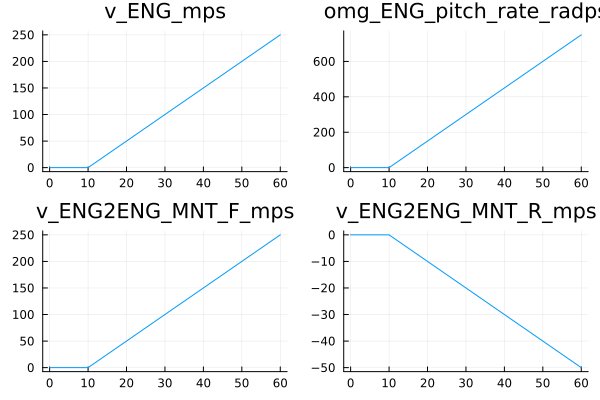

Test Summary: |Time
v_z_carbody   | None  0.4s


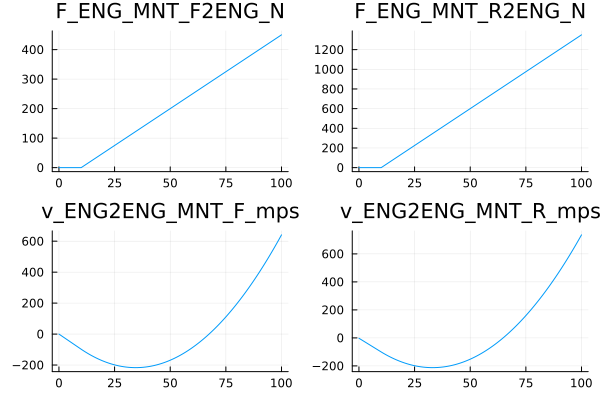

Test Summary: |Time
z_velocity    | None  0.1s


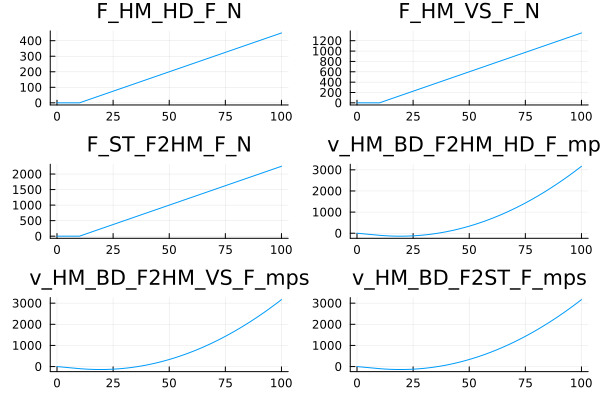

Test Summary: |Time
ENG_PNT       | None  0.5s


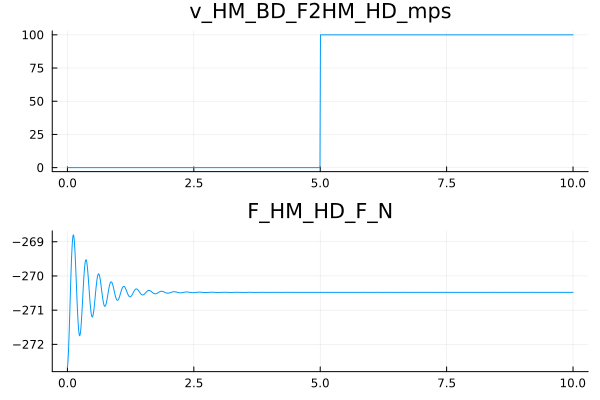

Test Summary: |Time
HM_BD_F_PNT   | None  0.6s


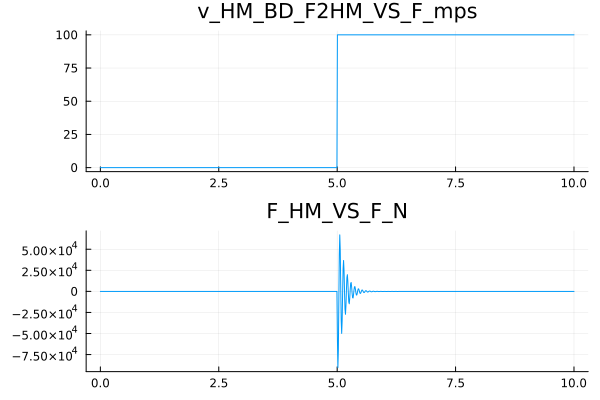

Test Summary: |Time
HM_HD_F_PNT   | None  0.6s


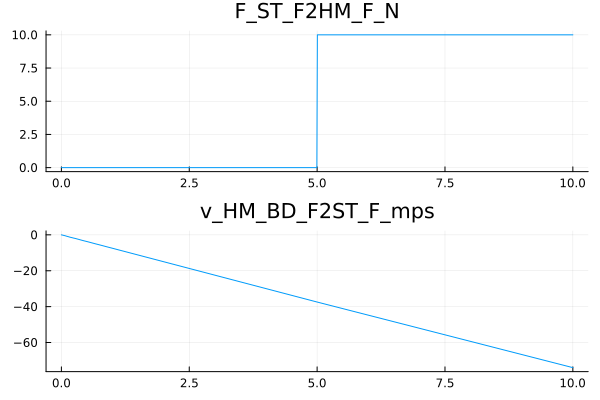

Test Summary: |Time
HM_VS_F_PNT   | None  0.3s


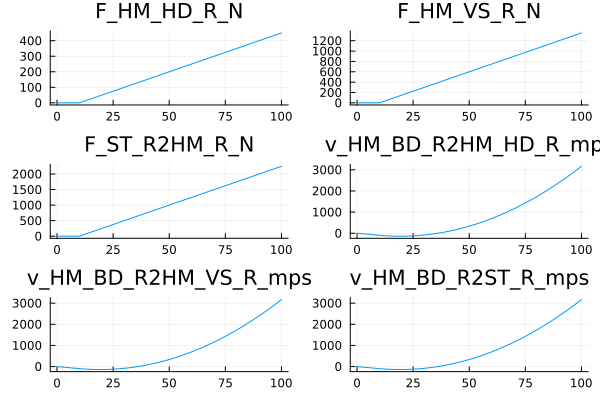

Test Summary: |Time
HM_F_PNT      | None  0.6s


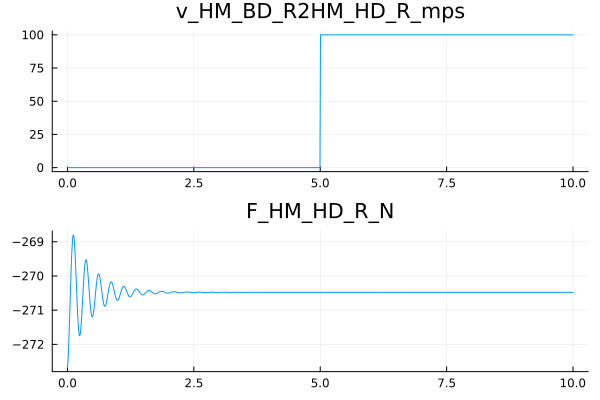

Test Summary: |Time
HM_BD_R_PNT   | None  0.5s


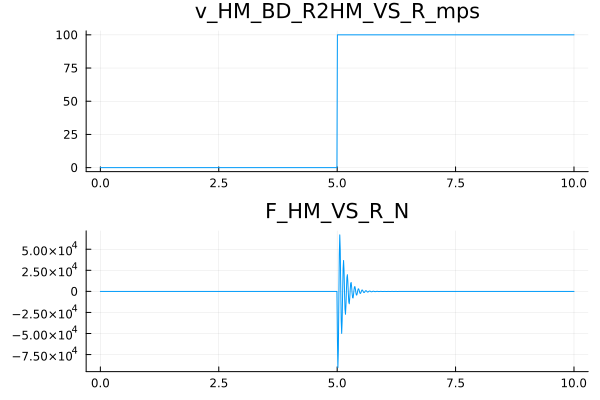

Test Summary: |Time
HM_HD_R_PNT   | None  0.5s


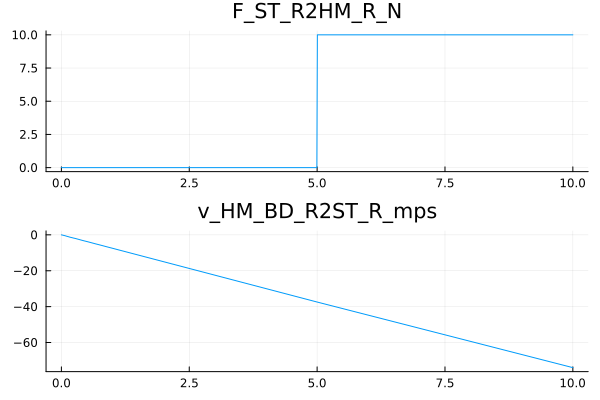

Test Summary: |Time
HM_VS_R_PNT   | None  0.4s


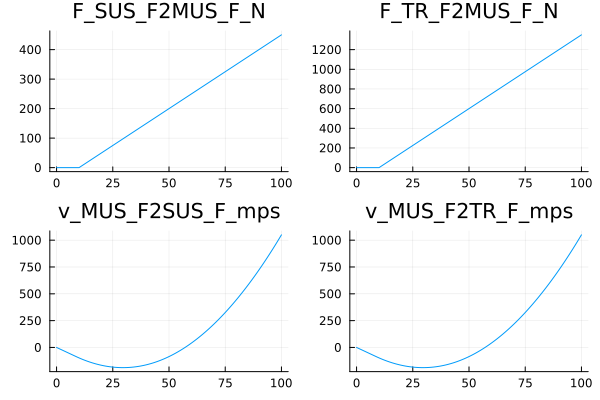

Test Summary: |Time
HM_R_PNT      | None  0.6s


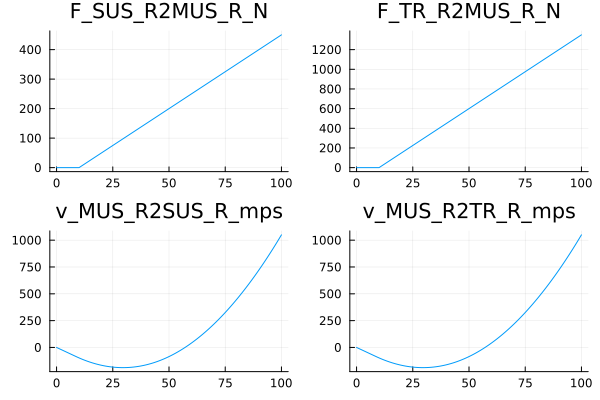

Test Summary: |Time
MUS_F_PNT     | None  0.4s


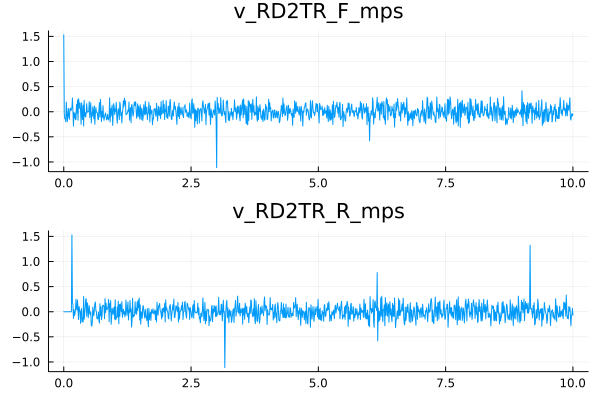

Test Summary: |Time
MUS_R_PNT     | None  0.5s


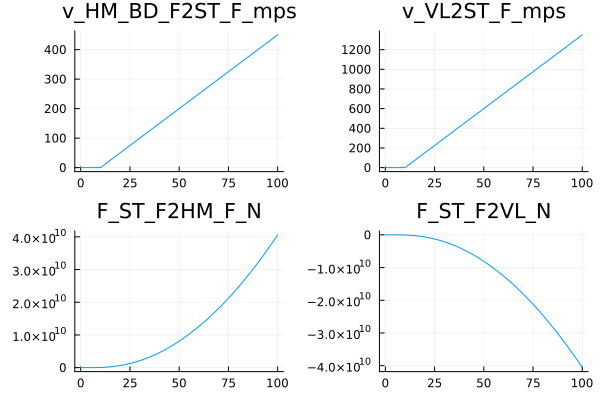

Test Summary: |Time
RD_PNT        | None  0.6s


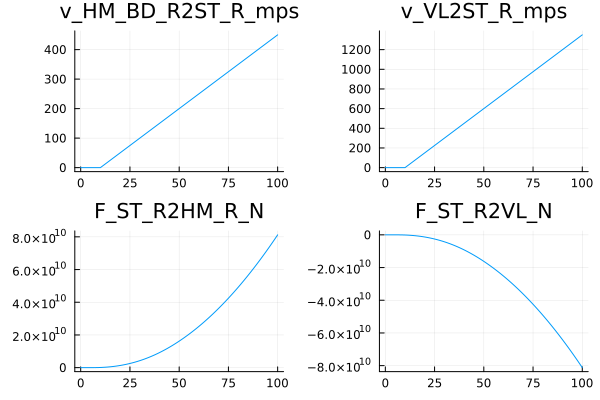

Test Summary: |Time
ST_F_PNT      | None  0.3s


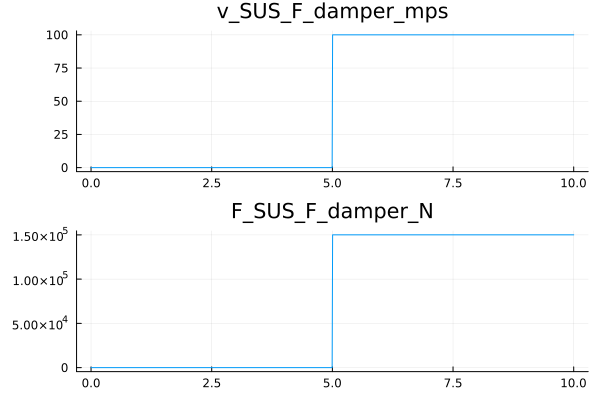

Test Summary: |Time
ST_R_PNT      | None  0.3s


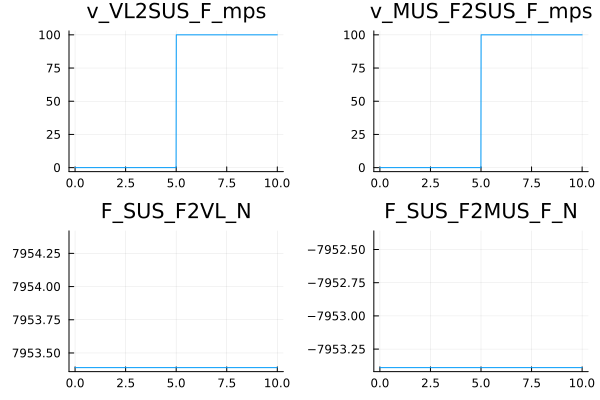

Test Summary: |Time
front_damper  | None  0.3s


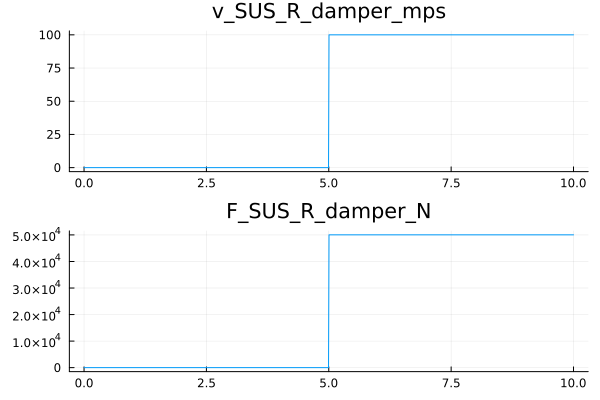

Test Summary: |Time
SUS_F_PNT     | None  0.6s


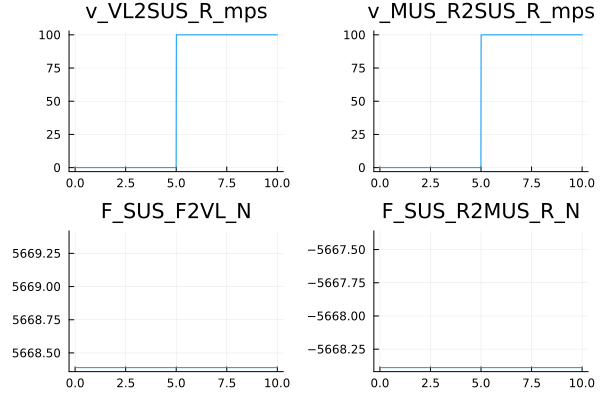

Test Summary: |Time
rear_damper   | None  0.2s


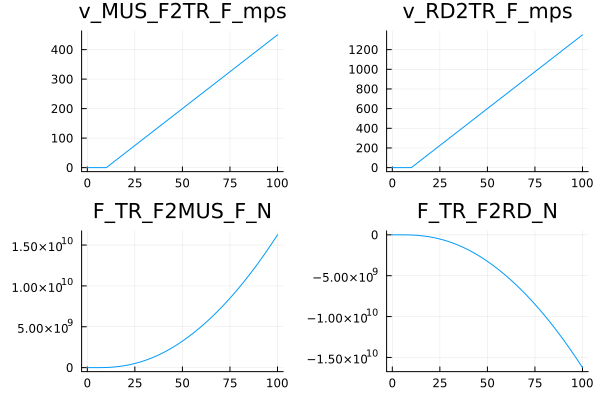

Test Summary: |Time
SUS_R_PNT     | None  0.6s


Test Summary: |Time
TR_F_PNT      | None  0.3s


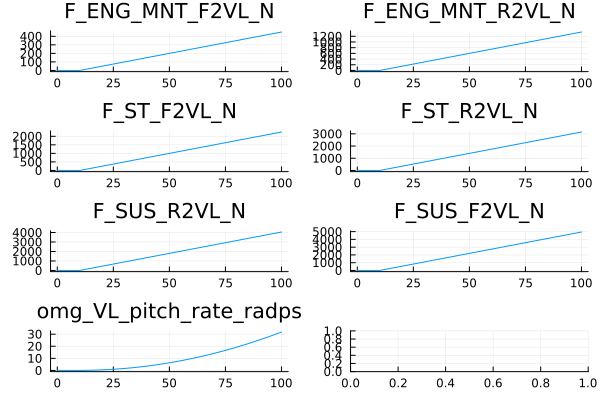

Test Summary: |Time
TR_R_PNT      | None  0.3s


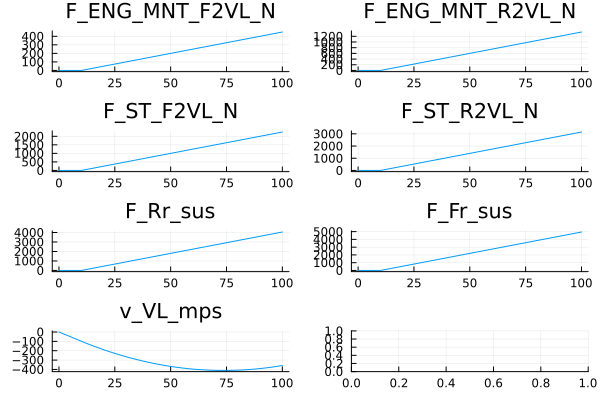

Test Summary: |Time
pitch_rate_vl | None  0.7s


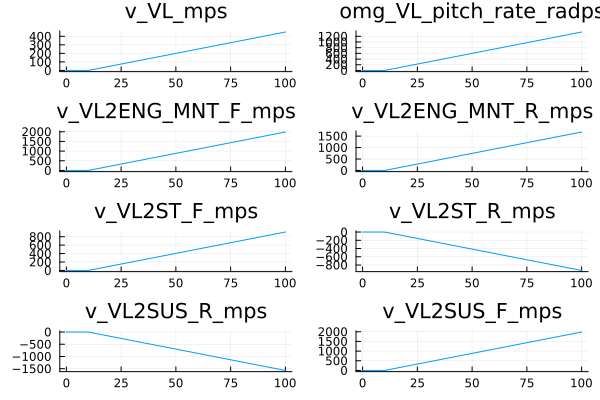

Test Summary:  |Time
v_z_carbody_vl | None  0.6s


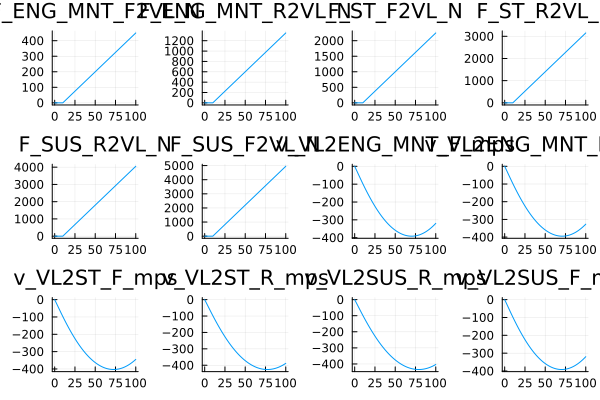

Test Summary: |Time
z_velocity_vl | None  0.4s


Test Summary: |Time
VL_PNT        | None  1.0s


In [59]:
include("unittests.jl")

  0.403864 seconds (185.53 k allocations: 8.760 MiB)


  3.707061 seconds (4.64 M allocations: 365.759 MiB, 76.73% compilation time)
  0.003452 seconds (1.33 k allocations: 178.172 KiB)


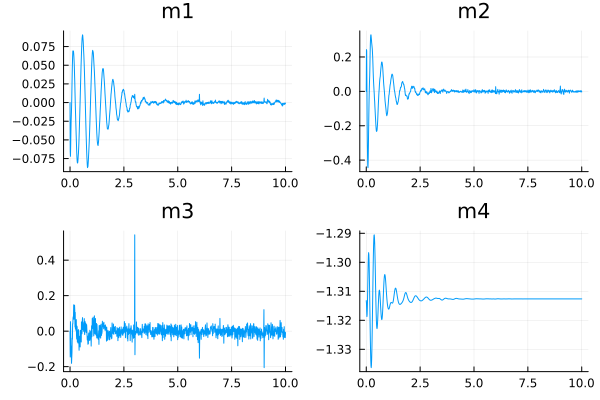

In [68]:
@model sim begin
    @block begin
        b = Vehicle()
        m1 = From(tag=:v_VL_mps)
        m2 = From(tag=:omg_VL_pitch_rate_radps)
        m3 = From(tag=:v_MUS_R2SUS_R_mps)
        m4 = From(tag=:L_SUS_R_stroke_m)
        m5 = From(tag=:v_MUS_F2SUS_F_mps)
        m6 = From(tag=:L_SUS_F_stroke_m)
        m7 = From(tag=:a_HM_F_neck_rad)
        m8 = From(tag=:a_HM_HD_R_neck_rad)
    end
    @scope begin
        m1.out => m1
        m2.out => m2
        m5.out => m3
        m8.out => m4
    end
end
@time m = @compile_derivative sim()
@time result = simulate(m, tspan=[0,10])
@time plot(result, layout=(2,2))
